In [2]:
import glob
import os
import pandas as pd
from scipy import stats
import statsmodels.api as sm
import seaborn as sns
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

### Articles DataFrame EDA

In [3]:
# read articles csv file into a dataframe
articles_df = pd.read_csv(path)
articles_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 364047 entries, 0 to 364046
Data columns (total 5 columns):
 #   Column         Non-Null Count   Dtype
---  ------         --------------   -----
 0   article_id     364047 non-null  int64
 1   category_id    364047 non-null  int64
 2   created_at_ts  364047 non-null  int64
 3   publisher_id   364047 non-null  int64
 4   words_count    364047 non-null  int64
dtypes: int64(5)
memory usage: 13.9 MB


In [4]:
articles_df.head()

,article_id,category_id,created_at_ts,publisher_id,words_count
0,0,0,1513144419000,0,168
1,1,1,1405341936000,0,189
2,2,1,1408667706000,0,250
3,3,1,1408468313000,0,230
4,4,1,1407071171000,0,162


In [5]:
articles_df.tail()

,article_id,category_id,created_at_ts,publisher_id,words_count
364042,364042,460,1434034118000,0,144
364043,364043,460,1434148472000,0,463
364044,364044,460,1457974279000,0,177
364045,364045,460,1515964737000,0,126
364046,364046,460,1505811330000,0,479


In [6]:
# Look for missing values
articles_df.isnull().sum()

article_id       0
category_id      0
created_at_ts    0
publisher_id     0
words_count      0
dtype: int64

In [7]:
# Check for duplicate rows
articles_df.duplicated()

0         False
1         False
2         False
3         False
4         False
          ...  
364042    False
364043    False
364044    False
364045    False
364046    False
Length: 364047, dtype: bool

In [8]:
## Check how many rows each article id has
articles_df['article_id'].value_counts()

article_id
0         1
242727    1
242703    1
242702    1
242701    1
         ..
121347    1
121346    1
121345    1
121344    1
364046    1
Name: count, Length: 364047, dtype: int64

In [9]:
# Check the number of unique values in each column
articles_df.nunique()

article_id       364047
category_id         461
created_at_ts    359552
publisher_id          1
words_count         866
dtype: int64

In [10]:
#convert epoch timestamps to human date
articles_df['created_at_ts']=pd.to_datetime(articles_df['created_at_ts'], unit='ms',origin='unix')
articles_df.head()

,article_id,category_id,created_at_ts,publisher_id,words_count
0,0,0,2017-12-13 05:53:39,0,168
1,1,1,2014-07-14 12:45:36,0,189
2,2,1,2014-08-22 00:35:06,0,250
3,3,1,2014-08-19 17:11:53,0,230
4,4,1,2014-08-03 13:06:11,0,162


In [11]:
articles_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 364047 entries, 0 to 364046
Data columns (total 5 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   article_id     364047 non-null  int64         
 1   category_id    364047 non-null  int64         
 2   created_at_ts  364047 non-null  datetime64[ns]
 3   publisher_id   364047 non-null  int64         
 4   words_count    364047 non-null  int64         
dtypes: datetime64[ns](1), int64(4)
memory usage: 13.9 MB


### Clicks DataFrame EDA

In [12]:
# read the clicks data into a dataframe

path = r'/Users/adam/GitHub/public_portfolio/kaggle_globo_user_interactions/clicks_hour' # use your path
all_files = glob.glob(os.path.join(path, "*.csv"))

clicks_df = pd.concat((pd.read_csv(f) for f in all_files), ignore_index=True)

In [13]:
clicks_df.head()

,user_id,session_id,session_start,session_size,click_article_id,click_timestamp,click_environment,click_deviceGroup,click_os,click_country,click_region,click_referrer_type
0,93863,1507865792177843,1507865792000,2,96210,1507865832925,4,3,2,1,21,2
1,93863,1507865792177843,1507865792000,2,158094,1507865862925,4,3,2,1,21,2
2,294036,1507865795185844,1507865795000,2,20691,1507865819095,4,3,20,1,9,2
3,294036,1507865795185844,1507865795000,2,96210,1507865849095,4,3,20,1,9,2
4,77136,1507865796257845,1507865796000,2,336245,1507866133178,4,3,2,1,25,2


In [14]:
clicks_df.tail()

,user_id,session_id,session_start,session_size,click_article_id,click_timestamp,click_environment,click_deviceGroup,click_os,click_country,click_region,click_referrer_type
2988176,15107,1507872960434128,1507872960000,4,20691,1507873325254,4,4,2,1,14,1
2988177,15107,1507872960434128,1507872960000,4,327984,1507873616575,4,4,2,1,14,1
2988178,15107,1507872960434128,1507872960000,4,172760,1507873646575,4,4,2,1,14,1
2988179,294270,1507872968214129,1507872968000,2,96210,1507873274995,4,3,2,1,25,2
2988180,294270,1507872968214129,1507872968000,2,336245,1507873304995,4,3,2,1,25,2


In [15]:
clicks_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2988181 entries, 0 to 2988180
Data columns (total 12 columns):
 #   Column               Dtype 
---  ------               ----- 
 0   user_id              object
 1   session_id           object
 2   session_start        object
 3   session_size         object
 4   click_article_id     object
 5   click_timestamp      object
 6   click_environment    object
 7   click_deviceGroup    object
 8   click_os             object
 9   click_country        object
 10  click_region         object
 11  click_referrer_type  object
dtypes: object(12)
memory usage: 273.6+ MB


In [16]:
# Check the number of unique values in each column
clicks_df.nunique()

user_id                 322897
session_id             1048594
session_start           646874
session_size                72
click_article_id         46033
click_timestamp        2983198
click_environment            3
click_deviceGroup            5
click_os                     8
click_country               11
click_region                28
click_referrer_type          7
dtype: int64

In [17]:
# Look for missing values
clicks_df.isnull().sum()

user_id                0
session_id             0
session_start          0
session_size           0
click_article_id       0
click_timestamp        0
click_environment      0
click_deviceGroup      0
click_os               0
click_country          0
click_region           0
click_referrer_type    0
dtype: int64

In [18]:
# Check for duplicate rows
clicks_df.duplicated()

0          False
1          False
2          False
3          False
4          False
           ...  
2988176    False
2988177    False
2988178    False
2988179    False
2988180    False
Length: 2988181, dtype: bool

In [19]:
## Check how many rows each article id has
clicks_df['click_article_id'].value_counts()

click_article_id
160974    37213
272143    28943
336221    23851
234698    23499
123909    23122
          ...  
283269        1
329065        1
38473         1
289316        1
164517        1
Name: count, Length: 46033, dtype: int64

In [20]:
## Check how many rows each user id has
clicks_df['user_id'].value_counts()

user_id
5890      1232
73574      939
15867      900
80350      783
15275      746
          ... 
69650        2
69640        2
69637        2
69625        2
294270       2
Name: count, Length: 322897, dtype: int64

In [21]:
## Check how many rows each session id has
clicks_df['session_id'].value_counts()

session_id
1507563657895091    124
1507896573228093    107
1507133567968022    106
1507309773225261     98
1508112331270612     94
                   ... 
1507588077276890      2
1507588084253896      2
1507588086133897      2
1507588089191899      2
1507872968214129      2
Name: count, Length: 1048594, dtype: int64

In [22]:
## To get the most granular you have to look at session_id with click_article_id
clicks_df[['session_id','click_article_id']].value_counts()

session_id        click_article_id
1506825423271737  68866               1
1507661067218704  59681               1
1507661068318706  336221              1
1507661070344707  32082               1
                  156052              1
                                     ..
1507226662529347  299152              1
1507226662602349  123909              1
                  168623              1
1507226663280351  124228              1
1508211379189330  234481              1
Name: count, Length: 2988181, dtype: int64

In [23]:
#convert epoch timestamps to human date
clicks_df['session_start']=pd.to_datetime(clicks_df['session_start'], unit='ms',origin='unix')
clicks_df['click_timestamp']=pd.to_datetime(clicks_df['click_timestamp'], unit='ms',origin='unix')
clicks_df.head()

,user_id,session_id,session_start,session_size,click_article_id,click_timestamp,click_environment,click_deviceGroup,click_os,click_country,click_region,click_referrer_type
0,93863,1507865792177843,2017-10-13 03:36:32,2,96210,2017-10-13 03:37:12.925,4,3,2,1,21,2
1,93863,1507865792177843,2017-10-13 03:36:32,2,158094,2017-10-13 03:37:42.925,4,3,2,1,21,2
2,294036,1507865795185844,2017-10-13 03:36:35,2,20691,2017-10-13 03:36:59.095,4,3,20,1,9,2
3,294036,1507865795185844,2017-10-13 03:36:35,2,96210,2017-10-13 03:37:29.095,4,3,20,1,9,2
4,77136,1507865796257845,2017-10-13 03:36:36,2,336245,2017-10-13 03:42:13.178,4,3,2,1,25,2


In [24]:
# max and min click date
print('Max and Min Click Dates')
print(str(clicks_df['click_timestamp'].max())+' as max date.')
print(str(clicks_df['click_timestamp'].min())+' as min date.')
print()
# max and min session start date
print('Max and Min Session Start Dates')
print(str(clicks_df['session_start'].max())+' as max date.')
print(str(clicks_df['session_start'].min())+' as min date.')

Max and Min Click Dates
2017-11-13 20:04:14.886000 as max date.
2017-10-01 03:00:00.026000 as min date.

Max and Min Session Start Dates
2017-10-17 03:36:19 as max date.
2017-10-01 02:37:03 as min date.


In [25]:
# Look at the number of rows with dates greater than the greatest session start date.

# Specify the specific date for comparison
specific_date = pd.to_datetime('2017-10-18')

# Count the number of rows with a date greater than the specific date
count_rows = len(clicks_df[clicks_df['click_timestamp'] >= specific_date])

print(f"Number of rows with a date greater than {specific_date}: {count_rows}")

Number of rows with a date greater than 2017-10-18 00:00:00: 712


In [26]:
# Look at the rows
clicks_df[clicks_df['click_timestamp']>=specific_date].head(10)

,user_id,session_id,session_start,session_size,click_article_id,click_timestamp,click_environment,click_deviceGroup,click_os,click_country,click_region,click_referrer_type
71549,178501,1507913310710880,2017-10-13 16:48:30,8,263963,2017-10-22 14:40:17.301,4,1,17,1,14,1
71550,178501,1507913310710880,2017-10-13 16:48:30,8,264096,2017-10-22 14:48:07.400,4,1,17,1,14,1
71551,178501,1507913310710880,2017-10-13 16:48:30,8,176979,2017-10-22 14:51:49.563,4,1,17,1,14,7
71552,178501,1507913310710880,2017-10-13 16:48:30,8,178098,2017-10-22 14:54:17.824,4,1,17,1,14,7
71553,178501,1507913310710880,2017-10-13 16:48:30,8,16097,2017-10-22 14:59:26.251,4,1,17,1,14,7
71554,178501,1507913310710880,2017-10-13 16:48:30,8,30027,2017-10-22 15:06:39.920,4,1,17,1,14,7
71555,178501,1507913310710880,2017-10-13 16:48:30,8,361278,2017-10-22 15:07:09.920,4,1,17,1,14,7
81549,38713,1507916005390334,2017-10-13 17:33:25,11,351421,2017-10-19 09:41:57.013,4,1,17,1,25,1
81550,38713,1507916005390334,2017-10-13 17:33:25,11,97039,2017-10-20 20:59:53.431,4,1,17,1,25,2
81551,38713,1507916005390334,2017-10-13 17:33:25,11,352713,2017-10-21 09:32:55.974,4,1,17,1,25,1


In [27]:
clicks_df = clicks_df[clicks_df['click_timestamp']<specific_date]

In [28]:
# Look for missing values
clicks_df.isnull().sum()

user_id                0
session_id             0
session_start          0
session_size           0
click_article_id       0
click_timestamp        0
click_environment      0
click_deviceGroup      0
click_os               0
click_country          0
click_region           0
click_referrer_type    0
dtype: int64

In [29]:
clicks_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2987469 entries, 0 to 2988180
Data columns (total 12 columns):
 #   Column               Dtype         
---  ------               -----         
 0   user_id              object        
 1   session_id           object        
 2   session_start        datetime64[ns]
 3   session_size         object        
 4   click_article_id     object        
 5   click_timestamp      datetime64[ns]
 6   click_environment    object        
 7   click_deviceGroup    object        
 8   click_os             object        
 9   click_country        object        
 10  click_region         object        
 11  click_referrer_type  object        
dtypes: datetime64[ns](2), object(10)
memory usage: 296.3+ MB


In [145]:
clicks_df.groupby(by=['user_id','session_id'])['click_article_id'].count().sort_values()

user_id  session_id      
55157    1508160766170228      1
50711    1508152927350133      1
1568     1508176451250517      1
178501   1507913310710880      1
320749   1508186024168617      1
                            ... 
313176   1508112331270612     94
80350    1507309773225261     98
73574    1507133567968022    106
9261     1507896573228093    107
73574    1507563657895091    124
Name: click_article_id, Length: 1048568, dtype: int64

In [148]:
bounce_rate = pd.DataFrame(clicks_df.groupby(by=['user_id','session_id'])['click_article_id'].count().sort_values()).reset_index()
bounce_rate.rename(columns={"click_article_id":"articles_clicked"},inplace=True)

In [150]:
bounce_rate[bounce_rate['articles_clicked']==1]

,user_id,session_id,articles_clicked
0,55157,1508160766170228,1
1,50711,1508152927350133,1
2,1568,1508176451250517,1
3,178501,1507913310710880,1
4,320749,1508186024168617,1
5,307202,1508020131994238,1
6,70311,1508177140420338,1
7,182988,1507738420428711,1
8,215206,1507822721699742,1
9,321209,1508190742235882,1


### Article Stats

In [30]:
# Do the article_id(s) in the articles DataFrame and the clicks DataFrame match up?
match_1 = pd.DataFrame(articles_df['article_id'].unique())
match_2 = pd.DataFrame(clicks_df['click_article_id'].unique())
match = match_1.merge(match_2,how='left').reset_index()

In [31]:
match.rename({'index': 'X', 0: 'Y'}, axis=1, inplace=True)
match

,X,Y
0,0,0
1,1,1
2,2,2
3,3,3
4,4,4
...,...,...
364042,364042,364042
364043,364043,364043
364044,364044,364044
364045,364045,364045


In [32]:
match['same'] = (match['X']==match['Y'])

In [33]:
match['same'].value_counts()

same
True    364047
Name: count, dtype: int64

In [34]:
# Get the 10 most viewed articles
n = 10
clicks_df['click_article_id'].value_counts()[:n].index.tolist()
top_articles = clicks_df['click_article_id'].value_counts()[:n].index.tolist()
top_articles

[160974, 272143, 336221, 234698, 123909, 336223, 96210, 162655, 183176, 168623]

In [35]:
top_articles = articles_df['article_id'].isin(top_articles)
articles_df[top_articles]

,article_id,category_id,created_at_ts,publisher_id,words_count
96210,96210,209,2017-10-12 08:59:51,0,274
123909,123909,250,2017-10-05 10:22:35,0,240
160974,160974,281,2017-10-02 02:52:27,0,259
162655,162655,281,2017-10-02 13:06:50,0,245
168623,168623,297,2017-10-04 19:07:30,0,157
183176,183176,301,2017-10-11 14:18:49,0,285
234698,234698,375,2017-10-10 06:56:37,0,183
272143,272143,399,2017-10-02 16:31:10,0,184
336221,336221,437,2017-10-10 05:26:01,0,158
336223,336223,437,2017-10-09 13:28:20,0,122


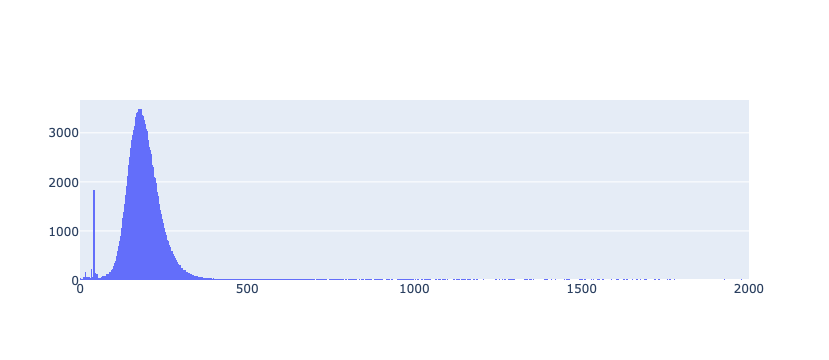

In [36]:
## Taking a look at the distribution of the word counts for the articles
import plotly.graph_objects as go

x = articles_df['words_count']
fig = go.Figure(data=[go.Histogram(x=x)])
fig.update_xaxes(autorangeoptions_maxallowed=2000)
fig.show()

<Axes: ylabel='words_count'>

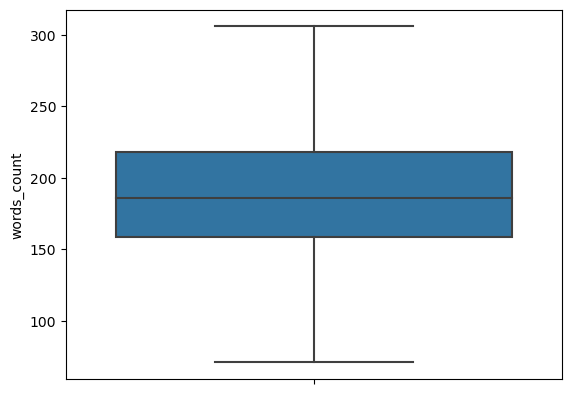

In [37]:
sns.boxplot(data=articles_df,y='words_count',showfliers = False)

In [38]:
x.describe()

count    364047.000000
mean        190.897727
std          59.502766
min           0.000000
25%         159.000000
50%         186.000000
75%         218.000000
max        6690.000000
Name: words_count, dtype: float64

In [39]:
# Measure the # of clicks for the article word count bins. Which length of articles gets the most interaction?
art_length = articles_df[['article_id','words_count']]
art_length.head()

,article_id,words_count
0,0,168
1,1,189
2,2,250
3,3,230
4,4,162


In [74]:
# Average word count per article
art_length['words_count'].mean()

190.89772749123054

In [82]:
art_clicks = pd.DataFrame(clicks_df.groupby('click_article_id')['click_timestamp'].count())
art_clicks.rename(columns={"click_timestamp":"click_count"},inplace=True)
art_clicks.reset_index()
art_clicks.head()

,click_count
click_article_id,
3,1
27,1
69,1
81,2
84,1


In [83]:
article_interactions=art_length.merge(art_clicks,left_on='article_id',right_on='click_article_id')
article_interactions.head()

,article_id,words_count,click_count
0,3,230,1
1,27,151,1
2,69,290,1
3,81,202,2
4,84,158,1


In [84]:
column2 = article_interactions['words_count'].values.flatten()
range = pd.cut(column2,bins=100)
range

[(200.7, 267.6], (133.8, 200.7], (267.6, 334.5], (200.7, 267.6], (133.8, 200.7], ..., (200.7, 267.6], (267.6, 334.5], (267.6, 334.5], (401.4, 468.3], (468.3, 535.2]]
Length: 45695
Categories (100, interval[float64, right]): [(-6.69, 66.9] < (66.9, 133.8] < (133.8, 200.7] < (200.7, 267.6] ... (6422.4, 6489.3] < (6489.3, 6556.2] < (6556.2, 6623.1] < (6623.1, 6690.0]]

In [85]:
article_interactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45695 entries, 0 to 45694
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   article_id   45695 non-null  int64
 1   words_count  45695 non-null  int64
 2   click_count  45695 non-null  int64
dtypes: int64(3)
memory usage: 1.0 MB


In [86]:
article_interactions.insert(2, 'ranges', range)

In [87]:
article_interactions.head()

,article_id,words_count,ranges,click_count
0,3,230,"(200.7, 267.6]",1
1,27,151,"(133.8, 200.7]",1
2,69,290,"(267.6, 334.5]",1
3,81,202,"(200.7, 267.6]",2
4,84,158,"(133.8, 200.7]",1


In [89]:
wordcount_range_interactions = pd.DataFrame(article_interactions.groupby('ranges')['click_count'].sum())
wordcount_range_interactions = wordcount_range_interactions.sort_values(by=['ranges'])
wordcount_range_interactions = wordcount_range_interactions.reset_index()

In [90]:
wordcount_range_interactions.head()

,ranges,click_count
0,"(-6.69, 66.9]",16692
1,"(66.9, 133.8]",114295
2,"(133.8, 200.7]",1433475
3,"(200.7, 267.6]",1165427
4,"(267.6, 334.5]",216902


In [91]:
wordcount_range_interactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   ranges       100 non-null    category
 1   click_count  100 non-null    int64   
dtypes: category(1), int64(1)
memory usage: 6.6 KB


In [94]:
wordcount_range_interactions['click_count'] = wordcount_range_interactions['click_count'].astype(int)
wordcount_range_interactions['ranges'] = wordcount_range_interactions['ranges'].astype(str)

In [96]:
wordcount_range_interactions.sort_values(by=['click_count'], ascending=False)

,ranges,click_count
2,"(133.8, 200.7]",1433475
3,"(200.7, 267.6]",1165427
4,"(267.6, 334.5]",216902
1,"(66.9, 133.8]",114295
12,"(802.8, 869.7]",18738
...,...,...
60,"(4014.0, 4080.9]",0
61,"(4080.9, 4147.8]",0
62,"(4147.8, 4214.7]",0
63,"(4214.7, 4281.6]",0


In [97]:
# look at the word count range by the number of unique visitors to the word counts
article_unique_visitors = pd.DataFrame(clicks_df.groupby(['click_article_id'])['user_id'].nunique().reset_index())
article_unique_visitors.rename(columns={"user_id":"visitor_count"},inplace=True)
article_interactions = article_interactions.merge(article_unique_visitors,how='left',left_on='article_id',right_on='click_article_id')
article_interactions

,article_id,words_count,ranges,click_count,click_article_id,visitor_count
0,3,230,"(200.7, 267.6]",1,3,1
1,27,151,"(133.8, 200.7]",1,27,1
2,69,290,"(267.6, 334.5]",1,69,1
3,81,202,"(200.7, 267.6]",2,81,2
4,84,158,"(133.8, 200.7]",1,84,1
...,...,...,...,...,...,...
45690,364017,218,"(200.7, 267.6]",22,364017,20
45691,364022,301,"(267.6, 334.5]",1,364022,1
45692,364028,284,"(267.6, 334.5]",1,364028,1
45693,364043,463,"(401.4, 468.3]",8,364043,8


In [98]:
article_interactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45695 entries, 0 to 45694
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   article_id        45695 non-null  int64   
 1   words_count       45695 non-null  int64   
 2   ranges            45695 non-null  category
 3   click_count       45695 non-null  int64   
 4   click_article_id  45695 non-null  int64   
 5   visitor_count     45695 non-null  int64   
dtypes: category(1), int64(5)
memory usage: 1.8 MB


In [99]:
article_interactions.groupby(by=['ranges'])['visitor_count'].mean().sort_values(ascending=False)

ranges
(802.8, 869.7]      3566.200000
(1003.5, 1070.4]    1527.400000
(200.7, 267.6]        80.540762
(267.6, 334.5]        79.581231
(133.8, 200.7]        60.599222
                       ...     
(6288.6, 6355.5]            NaN
(6355.5, 6422.4]            NaN
(6422.4, 6489.3]            NaN
(6489.3, 6556.2]            NaN
(6556.2, 6623.1]            NaN
Name: visitor_count, Length: 100, dtype: float64

In [100]:
article_interactions.groupby(by=['ranges'])['ranges'].count().sort_values(ascending=False)

ranges
(133.8, 200.7]      23382
(200.7, 267.6]      14278
(66.9, 133.8]        3907
(267.6, 334.5]       2696
(-6.69, 66.9]         911
                    ...  
(4014.0, 4080.9]        0
(4080.9, 4147.8]        0
(4147.8, 4214.7]        0
(1873.2, 1940.1]        0
(3345.0, 3411.9]        0
Name: ranges, Length: 100, dtype: int64

In [101]:
most_visited_words_range = pd.DataFrame(article_interactions.groupby(by=['ranges'])['visitor_count'].sum().reset_index().sort_values(by=['visitor_count'],ascending=False))
print(most_visited_words_range)

              ranges  visitor_count
2     (133.8, 200.7]        1416931
3     (200.7, 267.6]        1149961
4     (267.6, 334.5]         214551
1      (66.9, 133.8]         112743
12    (802.8, 869.7]          17831
..               ...            ...
60  (4014.0, 4080.9]              0
61  (4080.9, 4147.8]              0
62  (4147.8, 4214.7]              0
63  (4214.7, 4281.6]              0
50  (3345.0, 3411.9]              0

[100 rows x 2 columns]


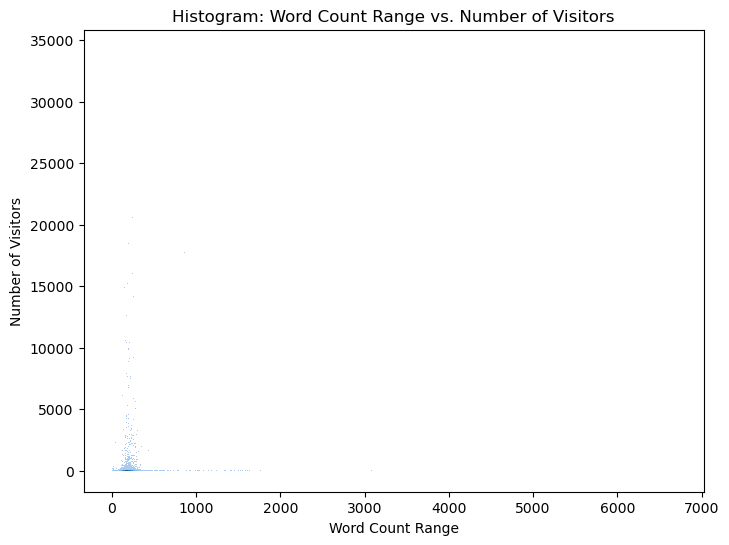

In [102]:
# Create a histogram
plt.figure(figsize=(8, 6))
sns.histplot(data=article_interactions, x='words_count', y='visitor_count', bins=1000)

plt.xlabel('Word Count Range')
plt.ylabel('Number of Visitors')
plt.title('Histogram: Word Count Range vs. Number of Visitors')
plt.show()

In [56]:
print("The most visited article word range count was 134-201 words.")
print()
print("This range of word counts makes up "+ str((round((1416931/(most_visited_words_range['visitor_count'].sum())*100),2)))+"%"+" of the total unique visitor count for all the articles")

The most visited article word range count was 134-201 words.

This range of word counts makes up 48.03% of the total unique visitor count for all the articles


/var/folders/v2/1t5n376n2gj64bckl0gz96wh0000gn/T/ipykernel_897/857224823.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



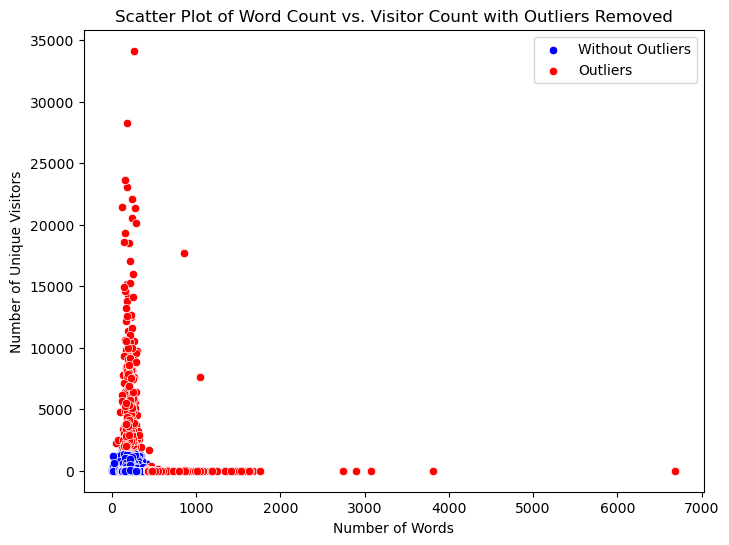

In [57]:
data = article_interactions[['words_count', 'visitor_count']]
data.rename(columns={"words_count": "X", "visitor_count": "Y"}, inplace=True)

z_scores = stats.zscore(data)
outliers_mask = (z_scores > 3) | (z_scores < -3)

df_no_outliers = data[~outliers_mask.any(axis=1)]

plt.figure(figsize=(8, 6))
sns.scatterplot(x='X', y='Y', data=df_no_outliers, color='blue', label='Without Outliers')
sns.scatterplot(x='X', y='Y', data=data[outliers_mask.any(axis=1)], color='red', label='Outliers')

plt.xlabel('Number of Words')
plt.ylabel('Number of Unique Visitors')
plt.title('Scatter Plot of Word Count vs. Visitor Count with Outliers Removed')
plt.legend()
plt.show()

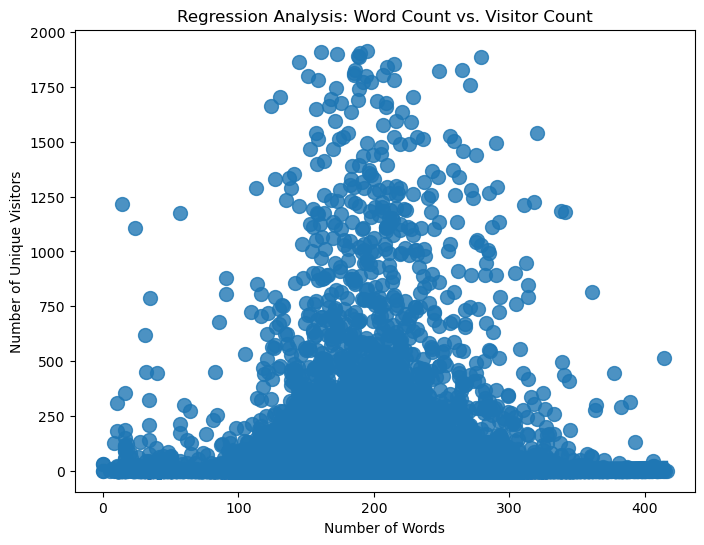

                            OLS Regression Results                            
Dep. Variable:                      Y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     38.14
Date:                Sun, 21 Jan 2024   Prob (F-statistic):           6.63e-10
Time:                        11:10:16   Log-Likelihood:            -2.7836e+05
No. Observations:               45204   AIC:                         5.567e+05
Df Residuals:                   45202   BIC:                         5.567e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.7854      2.034      6.287      0.0

In [58]:
# Scatter plot with a regression line
plt.figure(figsize=(8, 6))
sns.regplot(x='X', y='Y', data=df_no_outliers, scatter_kws={'s': 100}, ci=None)

plt.xlabel('Number of Words')
plt.ylabel('Number of Unique Visitors')
plt.title('Regression Analysis: Word Count vs. Visitor Count')
plt.show()

# Add a constant term for the intercept in the regression model
X = sm.add_constant(df_no_outliers['X'])

# Fit a linear regression model
model = sm.OLS(df_no_outliers['Y'], X).fit()

# Display regression summary
print(model.summary())

In [59]:
# Polynomial Regression Analysis

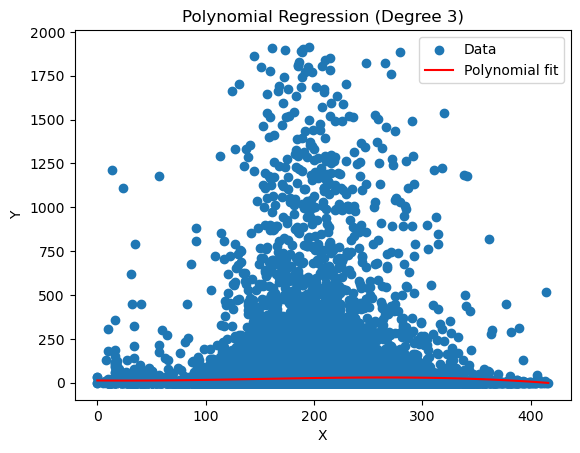

Predicted Y for X = 7: [[12.82392517]]


In [72]:
# Choose the degree of polynomial you want to fit
degree = 3  # Example: quadratic (degree 2)

x = np.array(df_no_outliers['X'])
x = x.reshape(-1,1)
y = np.array(df_no_outliers['Y'])
y = y.reshape(-1,1)

# Create polynomial features
poly = PolynomialFeatures(degree=degree)
X_poly = poly.fit_transform(x)

# Create and fit the polynomial regression model
model = LinearRegression()
model.fit(X_poly, y)

# Visualize the data and the polynomial fit
x_plot = np.linspace(x.min(), x.max(), 100).reshape(-1, 1)  # Reshape x_plot to be a column vector
y_plot = model.predict(poly.fit_transform(x_plot))

plt.scatter(x, y, label='Data')
plt.plot(x_plot, y_plot, color='red', label='Polynomial fit')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Polynomial Regression (Degree {})'.format(degree))
plt.legend()
plt.show()

# Make predictions using the model
new_x = np.array([7]).reshape(-1, 1)  # Reshape new_x to be a column vector
y_pred = model.predict(poly.fit_transform(new_x))
print("Predicted Y for X = 7:", y_pred)

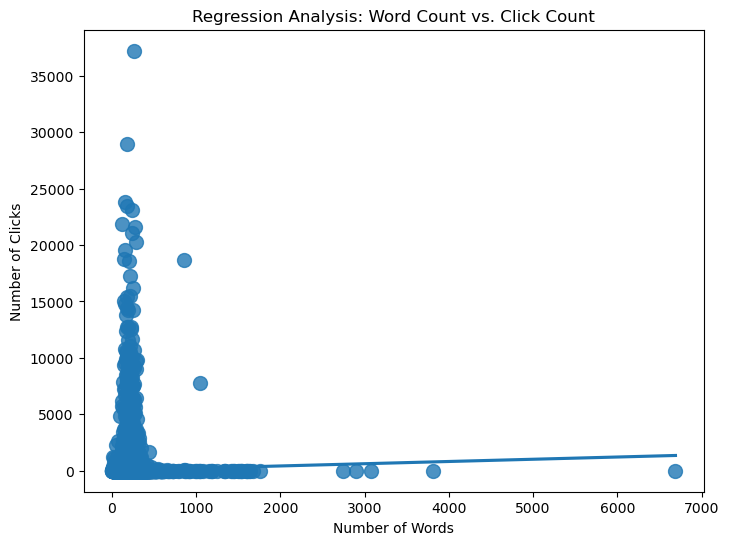

                            OLS Regression Results                            
Dep. Variable:            click_count   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     25.66
Date:                Sun, 21 Jan 2024   Prob (F-statistic):           4.08e-07
Time:                        12:20:12   Log-Likelihood:            -3.5948e+05
No. Observations:               45695   AIC:                         7.190e+05
Df Residuals:                   45693   BIC:                         7.190e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          27.4967      8.040      3.420      

In [108]:
# Look at word count versus click count
# Scatter plot with a regression line
plt.figure(figsize=(8, 6))
sns.regplot(x='words_count', y='click_count', data=article_interactions, scatter_kws={'s': 100}, ci=None)

plt.xlabel('Number of Words')
plt.ylabel('Number of Clicks')
plt.title('Regression Analysis: Word Count vs. Click Count')
plt.show()

# Add a constant term for the intercept in the regression model
X = sm.add_constant(article_interactions['words_count'])

# Fit a linear regression model
model = sm.OLS(article_interactions['click_count'], X).fit()

# Display regression summary
print(model.summary())

In [104]:
# Looking at what days of the week articles were created the most
articles_df.head()

,article_id,category_id,created_at_ts,publisher_id,words_count
0,0,0,2017-12-13 05:53:39,0,168
1,1,1,2014-07-14 12:45:36,0,189
2,2,1,2014-08-22 00:35:06,0,250
3,3,1,2014-08-19 17:11:53,0,230
4,4,1,2014-08-03 13:06:11,0,162


In [106]:
articles_df['created_day'] = articles_df['created_at_ts'].dt.strftime('%A')
articles_df['created_hour'] = articles_df['created_at_ts'].dt.strftime('%H')
articles_df.head()

,article_id,category_id,created_at_ts,publisher_id,words_count,created_day,created_hour
0,0,0,2017-12-13 05:53:39,0,168,Wednesday,05
1,1,1,2014-07-14 12:45:36,0,189,Monday,12
2,2,1,2014-08-22 00:35:06,0,250,Friday,00
3,3,1,2014-08-19 17:11:53,0,230,Tuesday,17
4,4,1,2014-08-03 13:06:11,0,162,Sunday,13


In [107]:
articles_df.groupby(by=['created_day'])['created_at_ts'].count().sort_values(ascending=False)

created_day
Wednesday    61842
Thursday     60486
Tuesday      60481
Friday       58569
Monday       57243
Saturday     34048
Sunday       31378
Name: created_at_ts, dtype: int64

In [143]:
articles_df.groupby(by=['created_hour'])['created_at_ts'].count().sort_values(ascending=False)

created_hour
10    26215
11    25688
12    25155
09    24606
08    24290
16    22658
07    22228
17    22124
18    22053
15    21571
13    20463
19    20316
14    20003
20    15400
06    14622
21    14384
22     6951
05     5430
23     4035
00     2291
04     1378
01     1036
02      597
03      553
Name: created_at_ts, dtype: int64

In [111]:
# Find the earlist time a user clicked on an article.

# Step 1: Group by the two specific dimensions and find the minimum datetime
earliest_dates = clicks_df.groupby(['user_id', 'click_article_id'])['click_timestamp'].min().reset_index()

# Step 2: Merge the DataFrame with the earliest dates to retain only the rows with the earliest datetime
earliest_click = pd.merge(clicks_df, earliest_dates, on=['user_id', 'click_article_id', 'click_timestamp'], how='inner')

earliest_click.head()

,user_id,session_id,session_start,session_size,click_article_id,click_timestamp,click_environment,click_deviceGroup,click_os,click_country,click_region,click_referrer_type
0,93863,1507865792177843,2017-10-13 03:36:32,2,96210,2017-10-13 03:37:12.925,4,3,2,1,21,2
1,93863,1507865792177843,2017-10-13 03:36:32,2,158094,2017-10-13 03:37:42.925,4,3,2,1,21,2
2,294036,1507865795185844,2017-10-13 03:36:35,2,20691,2017-10-13 03:36:59.095,4,3,20,1,9,2
3,294036,1507865795185844,2017-10-13 03:36:35,2,96210,2017-10-13 03:37:29.095,4,3,20,1,9,2
4,77136,1507865796257845,2017-10-13 03:36:36,2,336245,2017-10-13 03:42:13.178,4,3,2,1,25,2


In [112]:
# Look at the average time it took for an article to get clicked on after being created
wait_time = earliest_click[['click_article_id','click_timestamp']].merge(articles_df[['article_id','created_at_ts', 'created_day', 'words_count']], how='left',left_on='click_article_id',right_on='article_id')
wait_time.head()

,click_article_id,click_timestamp,article_id,created_at_ts,created_day,words_count
0,96210,2017-10-13 03:37:12.925,96210,2017-10-12 08:59:51,Thursday,274
1,158094,2017-10-13 03:37:42.925,158094,2017-10-12 10:22:31,Thursday,223
2,20691,2017-10-13 03:36:59.095,20691,2017-10-12 16:37:16,Thursday,226
3,96210,2017-10-13 03:37:29.095,96210,2017-10-12 08:59:51,Thursday,274
4,336245,2017-10-13 03:42:13.178,336245,2017-10-12 05:18:51,Thursday,150


In [114]:
wait_time['day_difference'] = (wait_time['click_timestamp'] - wait_time['created_at_ts']).dt.days
wait_time.head()

,click_article_id,click_timestamp,article_id,created_at_ts,created_day,words_count,day_difference
0,96210,2017-10-13 03:37:12.925,96210,2017-10-12 08:59:51,Thursday,274,0
1,158094,2017-10-13 03:37:42.925,158094,2017-10-12 10:22:31,Thursday,223,0
2,20691,2017-10-13 03:36:59.095,20691,2017-10-12 16:37:16,Thursday,226,0
3,96210,2017-10-13 03:37:29.095,96210,2017-10-12 08:59:51,Thursday,274,0
4,336245,2017-10-13 03:42:13.178,336245,2017-10-12 05:18:51,Thursday,150,0


In [115]:
wait_time.groupby(by=['created_day'])['day_difference'].mean().sort_values()

created_day
Monday        5.013728
Sunday        6.373625
Saturday      7.625570
Tuesday       8.391574
Wednesday     9.206010
Friday       10.610543
Thursday     11.273490
Name: day_difference, dtype: float64

In [116]:
wait_time['day_difference'].mean()

7.965824044626471

### Click Stats

In [117]:
# Look at the busiest day of the week by click count
weekday = pd.DataFrame(clicks_df['click_timestamp']).reset_index(drop=True)
weekday['day_of_week'] = weekday['click_timestamp'].dt.strftime('%A')
weekday['hour_of_day'] = weekday['click_timestamp'].dt.strftime('%H')

In [118]:
#Graph the busiest days of the week
weekday_graph = pd.DataFrame(weekday [['day_of_week','hour_of_day']].value_counts())
weekday_graph=pd.DataFrame(weekday_graph.reset_index())
weekday_graph

,day_of_week,hour_of_day,count
0,Monday,19,54513
1,Monday,20,54485
2,Monday,16,52797
3,Monday,15,49364
4,Monday,11,49290
...,...,...,...
163,Friday,06,1934
164,Thursday,05,1886
165,Wednesday,06,1638
166,Thursday,07,1221


In [138]:
day_order = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

# Assuming 'weekday_graph' is your DataFrame with columns 'hour_of_day', 'day_of_week', and 'count'
# Replace these column names with your actual column names

# Create the pivot table
pivot = pd.pivot_table(weekday_graph, values='count', 
                       index='hour_of_day', 
                       columns='day_of_week', 
                       aggfunc=np.max, 
                       fill_value=0)  # Adjust as needed

# Sort the columns based on the custom order
pivot = pivot[day_order]

# Round the values in the pivot table
pivot = np.round(pivot, 2)

# Display the corrected pivot table
print(pivot)

day_of_week  Sunday  Monday  Tuesday  Wednesday  Thursday  Friday  Saturday
hour_of_day                                                                
00             9781   23503    32826      15084     17764   13991     13599
01             8378   21127    31978      14715     16739   14168     13627
02             7768   15194    20834      11441     13066   14036     11950
03             7596    9538    12597       6722      8843    8643      7870
04             4616    5371     6257       3324      4683    4141      4421
05             2768    3289     3516       1989      1886    2346      2764
06             2035    2882     2895       1638      1084    1934      2050
07             2135    3828     3171       2215      1221    1978      2071
08             3313    8208     6973       4411      1972    3760      3470
09             7158   16954    16970      10203      4026    9041      8426
10            11539   29292    28714      20691      6104   20121     12868
11          

In [139]:
styled_pivot = pivot.style.background_gradient(cmap ='viridis').set_properties(**{'font-size': '20px'}) 
styled_pivot

day_of_week,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday
hour_of_day,,,,,,,
00,9781,23503,32826,15084,17764,13991,13599
01,8378,21127,31978,14715,16739,14168,13627
02,7768,15194,20834,11441,13066,14036,11950
03,7596,9538,12597,6722,8843,8643,7870
04,4616,5371,6257,3324,4683,4141,4421
05,2768,3289,3516,1989,1886,2346,2764
06,2035,2882,2895,1638,1084,1934,2050
07,2135,3828,3171,2215,1221,1978,2071
08,3313,8208,6973,4411,1972,3760,3470


In [142]:
#Export to excel
# Specify the Excel file path (replace 'output_file.xlsx' with your desired file name and path)
excel_file_path = '/Users/adam/GitHub/public_portfolio/kaggle_globo_user_interactions/click_pivot.xlsx'

# Export the DataFrame to Excel
pivot.to_excel(excel_file_path, index=False)  # Set index to False if you don't want to include the index in Excel

In [ ]:
busy_weekdays_clicks = pd.DataFrame(weekday['day_of_week'])
busy_weekdays_clicks['count'] = 1
busy_weekdays_clicks = pd.DataFrame(busy_weekdays_clicks.groupby(by=['day_of_week'])['count'].sum().reset_index())
busy_weekdays_clicks

In [ ]:
weekday_frequency = pd.DataFrame(clicks_df['click_timestamp']).reset_index(drop=True)
weekday_frequency['date'] = weekday['click_timestamp'].dt.strftime('%Y-%m-%d')
weekday_frequency['day_of_week'] = weekday['click_timestamp'].dt.strftime('%A')
weekday_frequency = weekday_frequency.drop(['click_timestamp'], axis=1)
weekday_frequency = pd.DataFrame(weekday_frequency[['date','day_of_week']].value_counts().reset_index())
weekday_frequency = pd.DataFrame(weekday_frequency[['date','day_of_week']].value_counts().reset_index())
weekday_frequency = pd.DataFrame(weekday_frequency.groupby(by=['day_of_week'])['count'].sum().reset_index())
weekday_frequency.rename(columns={"count":"day_count"},inplace=True)
weekday_frequency

In [ ]:
busy_weekday_avg_clicks = busy_weekdays_clicks.merge(weekday_frequency, how='left',on='day_of_week')
busy_weekday_avg_clicks['avg_click_count']=busy_weekday_avg_clicks['count']/busy_weekday_avg_clicks['day_count']
busy_weekday_avg_clicks = busy_weekday_avg_clicks.sort_values(by=['avg_click_count'],ascending=False)

In [ ]:
# plot busiest days of week by clicks
fig, ax = plt.subplots()

ax.bar(busy_weekday_avg_clicks['day_of_week'], busy_weekday_avg_clicks['avg_click_count'])

# Format the y-axis tick labels with commas
ax.get_yaxis().set_major_formatter(mticker.StrMethodFormatter('{x:,.0f}'))

# Set Labels
plt.xticks(rotation=45)
ax.set_xlabel('Day Of Week')
ax.set_ylabel('AVG Click Count')
ax.set_title('Busiest Days of Week by AVG Clicks')
#plt.tight_layout()

# Save the plot to an image file (e.g., PNG)
plt.savefig('days_of_weeks_by_clicks.png', bbox_inches='tight')

plt.show()

### Sessions Information

In [ ]:
# Session Start Time Frame
# Look at the average session start time
sessions = pd.DataFrame(clicks_df[['user_id','session_id','session_start','session_size','click_article_id','click_timestamp']]).reset_index(drop=True)
sessions['session_start_hour'] = clicks_df['session_start'].dt.strftime('%H')
sessions['click_hour'] = clicks_df['click_timestamp'].dt.strftime('%H')
sessions['click_minute'] = clicks_df['click_timestamp'].dt.strftime('%M')
#sessions.sort_values(by=['user_id','session_id'])

In [ ]:
sessions.info()

In [ ]:
# Average session start time is 2pm
#sessions['session_start_hour'].astype(int).mean()

# Drop rows with NaN values in 'click_hour'
sessions_hour_without_nan = sessions.dropna(subset=['session_start_hour'])

# Convert to integer and calculate the mean
mean_sessions_hour = sessions_hour_without_nan['session_start_hour'].astype(int).mean()

print(mean_sessions_hour)

In [ ]:
# Average click hour is 2pm

#sessions['click_hour'].astype(int).mean()

# Drop rows with NaN values in 'click_hour'
sessions_without_nan = sessions.dropna(subset=['click_hour'])

# Convert to integer and calculate the mean
mean_click_hour = sessions_without_nan['click_hour'].astype(int).mean()

print(mean_click_hour)

In [ ]:
sessions.groupby(by=['click_article_id'])['session_start'].count().sort_values(ascending=False)

The articles with the top traffic look similar when comparing number of clicks to number of sessions being started.

In [ ]:
sessions = sessions.sort_values(by=['user_id','session_id','session_start'])

In [ ]:
#sessions['session_start_hour'] = sessions['session_start_hour'].astype(int)
sessions.groupby(by=['user_id'])['session_start_hour'].count().sort_values(ascending=False)

Highest users are 5890, 73574, 15867, 80350, and 746.

In [ ]:
# Look to see how to determine bounce rate
bounce = sessions.groupby(['user_id','session_id','click_article_id'])['click_timestamp'].count().sort_values(ascending=False)
bounce = pd.DataFrame(bounce).reset_index()
bounce.head()

In [ ]:
bounce.info()

I do not see any signs of a user having multiple interactions with the same article at the same time. In essence these would all be bounces.

In [ ]:
sessions[sessions['user_id']==0].sort_values(by=['session_start'])



### User Information

In [ ]:
# Daily user information
sessions['session_date'] = sessions['session_start'].dt.date
sessions['session_date'].head()

In [ ]:
daily_unique_users = sessions.groupby(by=['session_date'])['user_id'].nunique()
daily_unique_users = pd.DataFrame(daily_unique_users).reset_index()
daily_unique_users['day_of_week'] = pd.to_datetime(daily_unique_users['session_date']).dt.strftime('%A')
daily_unique_users.rename(columns={'user_id':'users_count'}, inplace=True)
daily_unique_users

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

# Plot the time series line graph
ax.plot(daily_unique_users['session_date'], daily_unique_users['users_count'], label='# of Users', marker='o', linestyle='-')

# Format the y-axis tick labels with commas
ax.get_yaxis().set_major_formatter(mticker.StrMethodFormatter('{x:,.0f}'))

# Set labels and title
plt.xlabel('Date')
plt.ylabel('# of Users')
plt.title('Daily Unique Users')

# Display the legend
plt.legend()

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

#Save the plot
plt.savefig('daily_unique_users.png', bbox_inches='tight')
# Show the plot
plt.show()

In [ ]:
busy_weekdays_users = pd.DataFrame(daily_unique_users.groupby(by=['day_of_week'])['users_count'].mean().reset_index().sort_values(by=['users_count'],ascending=False))

fig, ax = plt.subplots()

ax.bar(busy_weekdays_users['day_of_week'],busy_weekdays_users['users_count'])

# Format the y-axis tick labels with commas
ax.get_yaxis().set_major_formatter(mticker.StrMethodFormatter('{x:,.0f}'))

# Set Labels
plt.xticks(rotation=45)
ax.set_xlabel('Day Of Week')
ax.set_ylabel('AVG Unique User Visits')
ax.set_title('Busiest Days of Week by AVG Unique User Visits')
#plt.tight_layout()

# Save the plot to an image file (e.g., PNG)
plt.savefig('days_of_weeks_by_users.png', bbox_inches='tight')

plt.show()

In [ ]:
article_views = sessions.groupby(['session_date','user_id'])['click_article_id'].nunique()
article_views = pd.DataFrame(article_views).reset_index()

In [ ]:
# Looking at the top users by most viewed articles a day.
article_views.groupby('user_id')['click_article_id'].mean().sort_values(ascending=False)